# 🐶 End-to-end workspace for dog breed identification  

### 1. Problem 
      Identifying the breed of a dog given its picture 

### 2. Data 
      The data is taken from kaggle 
      https://www.kaggle.com/c/dog-breed-identification
      
### 3. Evaluation 
        The evlauation of the project is giving a file of predicted probabilities of each dog breed. More info can be found here
         https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

### 4. Features 
        * We are having about 120 dog breeds 
        * The training data contains about 10k+ images with labels 
        * The testing data also contains about 10k+ images without labels 
        * As we are dealing with images(Unstructured data), we have to use technologies such as tensorflow,deep learning

In [ ]:
# !unzip "/content/drive/MyDrive/Dog_Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog_Vision/"

## Getting ready with the workspace 

In [ ]:
import tensorflow as tf 
import tensorflow_hub as hub 

print('Version of Tensorflow hub is: ',hub.__version__)
print('Version of Tensorflow is:', tf.__version__)
print('GPU','available :)' if tf.config.list_physical_devices('GPU') else 'not available :(')

Version of Tensorflow hub is:  0.12.0
Version of Tensorflow is: 2.8.2
GPU available :)


### Getting our data ready 

We have image data which is not numerical, so to work on we should convert into numerical data i.e Turning our data into tensors(numerical data) 

In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
%matplotlib inline 

labels_csv=pd.read_csv("drive/MyDrive/Dog_Vision/labels.csv")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [ ]:
labels_csv.breed.value_counts().median()

82.0

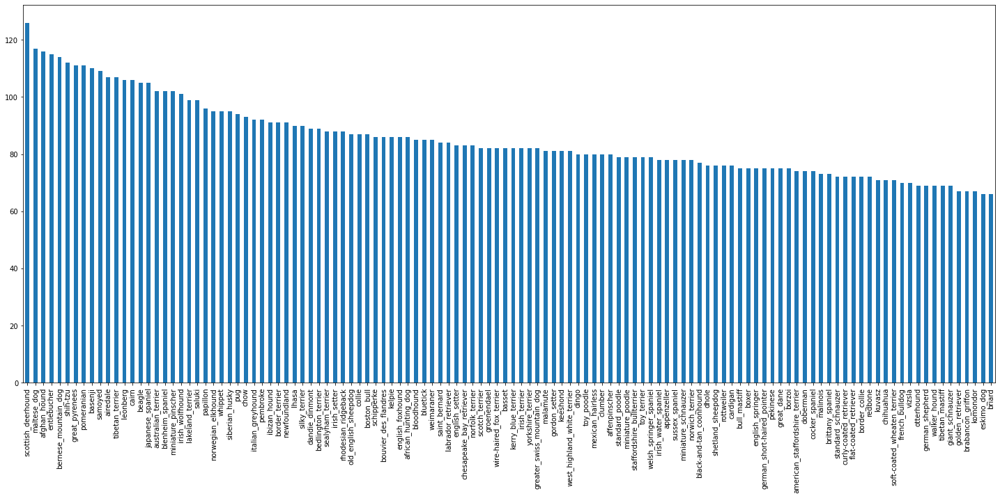

In [ ]:
labels_csv.breed.value_counts().plot.bar(figsize=(25,10))

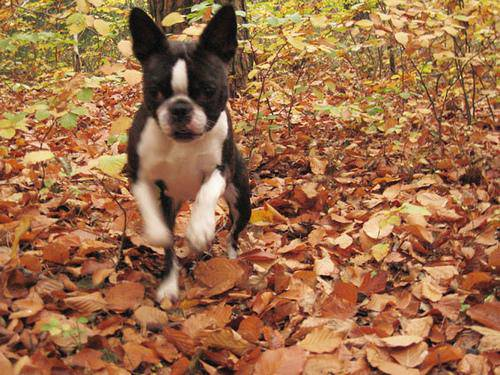

In [ ]:
### Lets look at a image from Ipython
from IPython.display import Image 
id=labels_csv['id'][0]
id+='.jpg'
Image(f'drive/MyDrive/Dog_Vision/train/{id}')

In [ ]:
## As id's are a lot big it would be tedious for us to copy that all the time,so lets create a filename list for it 

file_names=['drive/MyDrive/Dog_Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]
file_names[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os 
print(len(os.listdir('drive/MyDrive/Dog_Vision/train')))

10222


In [ ]:
len(file_names)

10222

In [ ]:
## Here labels list is nothing but a list of all breeds with duplicate elements 

labels=labels_csv['breed'].to_numpy()
print(labels,len(labels))

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever'] 10222


In [ ]:
unique_breeds=np.unique(labels)

In [ ]:
## Now we must check that the number of unique breeds is 120 
len(unique_breeds)

120

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## As Kaggle didn't give a validation set to practice on, let's create our own validation set 

In [ ]:

X=file_names
y=boolean_labels


In [ ]:
## As the length of the training data is about 10k+ which would take a lot of time, so lets decrease it.

NUM_IMAGES= 1000 #@param{type:'slider',min:1000,max:10000,step:1000}

In [ ]:
np.random.seed(21)

from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
print(X_train[:5],y_train[:2])

['drive/MyDrive/Dog_Vision/train/0296633efc21006e3ce2af7eaeff04f7.jpg', 'drive/MyDrive/Dog_Vision/train/0326344e0d5181130c28d25edd5627e4.jpg', 'drive/MyDrive/Dog_Vision/train/0e708dfe2a8c60849a4b625eda57d118.jpg', 'drive/MyDrive/Dog_Vision/train/011e06760794850c40f23d6426c40774.jpg', 'drive/MyDrive/Dog_Vision/train/1857ac9d2306fc646d4bb817aaa20424.jpg'] [array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,

## Now lets work with the images that we have, which will have about a few steps:-

1. Take the filenames of the images as input 
2. Use tensorflow to read the image and save it into a variable say `image`
3. Turn our images into tensors using tensor hub 
4. Normalize our image values from 0-255 to 0-1
4. Reshape all our images to a fixed size say 224 x 224 
5. Return the modified image 

Remember these all steps should be done in a function 

In [ ]:
IMG_SIZE=224

def image_tensors(img_path,img_size=IMG_SIZE):
  """
  Taking an image path and turning it into sensors 
  """

  #read an image file 
  image=tf.io.read_file(img_path)
  
  #Turning the image file into tensors with 3 colors [Red,Green,Blue]
  image=tf.image.decode_jpeg(image,channels=3)

  #Normalizing our image to size 0-1
  image=tf.image.convert_image_dtype(image,dtype=tf.float32)
            
  #Resizing our image to 224x224 
  image =tf.image.resize(image,size=[img_size,img_size])
    
  return image 

In [ ]:
print(image_tensors(file_names[26],IMG_SIZE))

tf.Tensor(
[[[0.25410587 0.2894     0.2776353 ]
  [0.29784313 0.33313724 0.32137254]
  [0.29804096 0.33333507 0.32157037]
  ...
  [0.41461015 0.46559054 0.38715917]
  [0.44833592 0.4993163  0.42088494]
  [0.44921985 0.5002003  0.42176887]]

 [[0.27608263 0.31137675 0.29961205]
  [0.30547515 0.34076926 0.32900456]
  [0.2880393  0.3233334  0.3115687 ]
  ...
  [0.41783687 0.46881726 0.3903859 ]
  [0.46009547 0.51107585 0.4326445 ]
  [0.48616162 0.537142   0.45871064]]

 [[0.29875293 0.33404705 0.3144392 ]
  [0.27189255 0.30718666 0.28757882]
  [0.28608775 0.32138187 0.30177402]
  ...
  [0.47503573 0.5260161  0.44758475]
  [0.49345425 0.54443467 0.46600327]
  [0.4703167  0.5212971  0.44286573]]

 ...

 [[0.77551085 0.7260472  0.59820485]
  [0.8635614  0.8325143  0.6913045 ]
  [0.7919249  0.68785155 0.5528405 ]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[0.7009566  0.76328325 0.5983139 ]
  [0.74205637 0.6888017  0

In [ ]:
def get_image_label(img_path,label):
  """
  It returns the processed image with label with the above helper function 
  """
  img=image_tensors(img_path)
  return img,label 

* Now let's make a function for our data to turn into batches i.e splitting into data into smaller batches(of size say 32), so that it will take less time to process at a time.

In [ ]:
BATCH_SIZE=32 

def create_data_batch(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of given batch size from our data.
  It also accepts data without labels.
  """
  if test_data:
    print('Creating data batches for test data')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) #just making a dataset out of data 
    data=data.map(image_tensors).batch(batch_size)
    return data 
  
  elif valid_data:
    print('Creating data batches for valid data')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data=data.map(get_image_label).batch(batch_size)
    return data  
  else:
    print('Creating data batches for train data')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data=data.shuffle(len(X))
    data=data.map(get_image_label).batch(batch_size)
    return data 
  

In [ ]:
valid_batch=create_data_batch(X_val,y_val,valid_data=True)
train_batch=create_data_batch(X_train,y_train)

Creating data batches for valid data
Creating data batches for train data


In [ ]:
train_batch.element_spec,valid_batch.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches 
Lets visualize the images/data inside of these batches.

In [ ]:
def show_25_images(images,labels):
  """
  Prints 25 images in a batch with their respective label
  """
  ## Setting the figsize  
  plt.figure(figsize=(10,10))
  for i in range(25):
    ## Setting the rows and columns
    ax=plt.subplot(5,5,i+1)
    ## Printing the image 
    plt.imshow(images[i])
    ## Printing the label 
    plt.title(unique_breeds[labels[i].argmax()])
    ## Removing the grid 
    plt.axis('off')



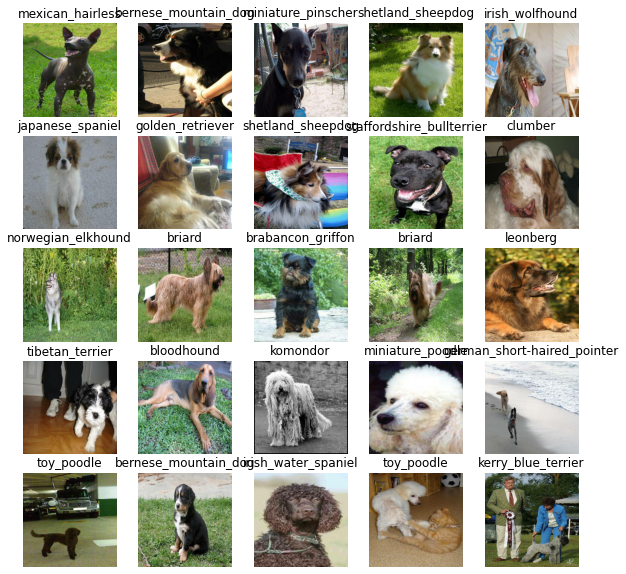

In [ ]:
train_img,train_label=next(train_batch.as_numpy_iterator())
len(train_img),len(train_label)
show_25_images(train_img,train_label)

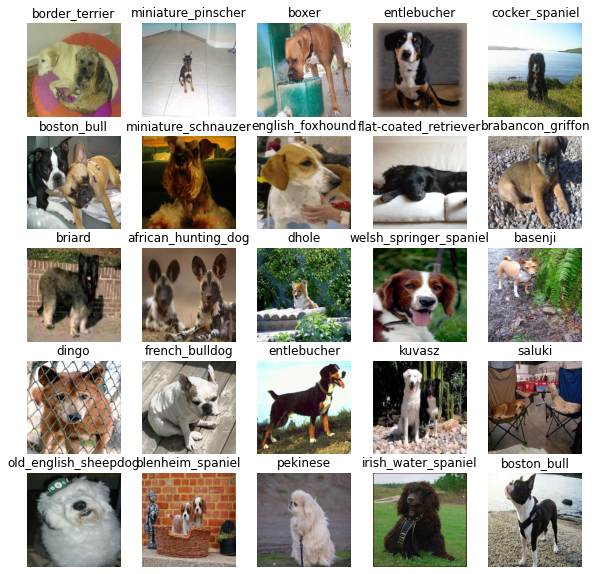

In [ ]:
val_img,val_label=next(valid_batch.as_numpy_iterator())
show_25_images(val_img,val_label)

## Picking a model 

Before picking up a model we need to know three things which are:

* Input shape of the fitting image 
* Output shape of the label
* Model url 

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs and outputs and model let's put them in a keras deep learning model   

Let's create a function which:
* Takes input shape,output shape,model
* Defines keras model in a sequential manner
* Compiles the model(Telling it to imporve on it's own )
* Build the model(taking the input shape )
* Return the model 

In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print('Building model with:',model_url)

  ## Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url), ## Layer1 (MODEL_URL)
      tf.keras.layers.Dense(units=output_shape,   ## Layer2 (Just making output to come in our required shpae)
                             activation="softmax")  
      ])
  
  ## Compile the model 
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  ## Building the model
  model.build(input_shape)

  return model 

In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks 

These callbacks are used to track the progress/statistics of a model during training and also to stop the model training if it's not improving or overfitting.

## Tensorboard Callback 

3 things to do before using it:
* Load the tensor_board extension 
* Create a log directory function so as to save the logs in a folder while fit()
* Visualize our tensorboard callback using a magic function.

In [ ]:
## Load tensor board notebook extension 
%load_ext tensorboard

In [ ]:
import datetime   

## Create a function for callbacks
def create_tensor_callbacks():
  log_dir=os.path.join('drive/MyDrive/Dog_Vision/logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return tf.keras.callbacks.TensorBoard(log_dir)


## Early callbacks function 

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

## Training a model 
Our model trains only on 1000 images of data as to reduce time and make sure it's working.

In [ ]:
NUM_EPOCHS=100#@param {type:'slider',min:10,max:100,step:10}


Let's create a model to train on our data 

* Setup a model using create_model()
* Do tensorboard callbacks using create_tensor_callbacks() 
* Call the fit() function with passing training data,validation data,num_epochs
* Return the model

In [ ]:
## Creating a function to train data with the model 

def train_model():

  ## Creating our model 
  model=create_model()

  ## Creating tensorboard callback 
  tensorboard=create_tensor_callbacks() 

  ## Calling the fit function 
  model.fit(x=train_batch,epochs=NUM_EPOCHS,validation_data=valid_batch,callbacks=[tensorboard,early_stopping],validation_freq=1)

  return model 

In [ ]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 136s 4s/step - loss: 4.4841 - accuracy: 0.0938 - val_loss: 3.2138 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 3s 127ms/step - loss: 1.5721 - accuracy: 0.7125 - val_loss: 1.9991 - val_accuracy: 0.5600
Epoch 3/100
25/25 [==============================] - 3s 129ms/step - loss: 0.5354 - accuracy: 0.9450 - val_loss: 1.5504 - val_accuracy: 0.6350
Epoch 4/100
25/25 [==============================] - 3s 134ms/step - loss: 0.2404 - accuracy: 0.9850 - val_loss: 1.3663 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 139ms/step - loss: 0.1408 - accuracy: 1.0000 - val_loss: 1.3206 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 5s 188ms/step - loss: 0.0977 - accuracy: 1.0000 - val_loss: 1.2756 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

### Checking the tensor board logs 

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions=model.predict(valid_batch) 
print(predictions)

[[1.34199823e-03 1.11137844e-04 1.94033695e-04 ... 1.04541397e-02
  2.80352193e-04 1.21803314e-03]
 [5.92919714e-05 2.35339743e-04 5.22877206e-04 ... 1.07982615e-03
  1.71392458e-03 2.58106977e-01]
 [4.08841224e-05 8.75017577e-06 1.01798469e-04 ... 1.03678450e-03
  1.55387879e-05 1.29784210e-04]
 ...
 [7.97799032e-04 1.78374830e-04 1.53209603e-05 ... 6.84244078e-05
  1.40453945e-03 8.57225835e-01]
 [3.79087260e-06 9.67079250e-04 1.01164296e-05 ... 1.17433921e-03
  7.24828060e-05 7.82813640e-06]
 [7.79543843e-05 1.00890575e-04 1.59815172e-05 ... 3.29439354e-05
  1.00610494e-04 6.82944024e-04]]


In [ ]:
def get_predicted_label(predictions):
  """
  Get the required label i.e dog breed for a particular prediction
  """

  return unique_breeds[np.argmax(predictions)]


In [ ]:
print(get_predicted_label(predictions[0]))

cairn


### As our validation data is in a batch so as to compare with the true labels, we have to unbatchify it

In [ ]:
def unbatchify(data):
  """
  Takes a batch dataset and return the images 
  """
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels 

In [ ]:
val_images,val_labels=unbatchify(valid_batch)
print(val_images,val_labels)

[array([[[0.68392766, 0.71137863, 0.5474871 ],
        [0.67492336, 0.6984528 , 0.5560858 ],
        [0.66102475, 0.676711  , 0.57145894],
        ...,
        [0.57668304, 0.55860585, 0.42789343],
        [0.58891803, 0.5812756 , 0.39065254],
        [0.58244073, 0.57591933, 0.37195402]],

       [[0.67657703, 0.70398426, 0.54333127],
        [0.65835965, 0.68188906, 0.54618806],
        [0.6896166 , 0.7053029 , 0.6000508 ],
        ...,
        [0.58101887, 0.5653326 , 0.4274475 ],
        [0.58742785, 0.58018   , 0.377197  ],
        [0.57350975, 0.5695882 , 0.34993652]],

       [[0.66306615, 0.68659556, 0.5429506 ],
        [0.6753677 , 0.69661766, 0.5674685 ],
        [0.67864156, 0.69432783, 0.58907574],
        ...,
        [0.57533264, 0.55964637, 0.42176127],
        [0.55063206, 0.5433842 , 0.33981252],
        [0.57569695, 0.5717754 , 0.34824595]],

       ...,

       [[0.51298594, 0.4293987 , 0.08778513],
        [0.5231306 , 0.43562174, 0.11014619],
        [0.5168498 , 

Let's create a function which does the following: 
* Takes prediction probabilities and convert it into prediction label 
* Plot all the details in a single plot

In [ ]:
def plot_prediction_label(prediction_probabilites,images,labels,n):
  """
  This function takes the prediction probabilites of the model and plots the respective label and also the true label.
  """

  pred_prob,image,label=prediction_probabilites[n],images[n],labels[n]

  ### Get pred label
  pred_label=get_predicted_label(pred_prob)

  ## Plot the details 
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  ## Setting the colour to green if crct else red
  if pred_label == label:
    colour="green"
  else: 
    colour="red" 

  ### Set the title 
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,label),color=colour)

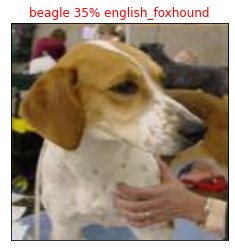

In [ ]:
plot_prediction_label(predictions,val_images,val_labels,n=7)

Now let's write a function which does the following: 
* Takes prediciton probabilities and labels 
* Bar plot the top 10 labels the model is predicting 
* Highlight the true label if it's in those 10 labels 

In [ ]:
def plot_pred_conf(prediction_probabilites,labels,n):
  """
  Bar plots the top 10 labels 
  """
  pred_probs,label=prediction_probabilites[n],labels[n]

  ### Get pred label 
  pred_label=get_predicted_label(pred_probs)
  top_10_index=pred_probs.argsort()[-10:][::-1]

  ### Get the prediction values 
  top_10_values=pred_probs[top_10_index]

  ## Get the prediction labels 
  top_10_labels=unique_breeds[top_10_index]

  top_plot=plt.bar(np.arange(len(top_10_labels)),top_10_values,color="grey")

  plt.xticks(np.arange(len(top_10_labels)),top_10_labels,rotation="vertical")

  if np.isin(label,top_10_labels):
    top_plot[np.argmax(top_10_labels==label)].set_color("green")


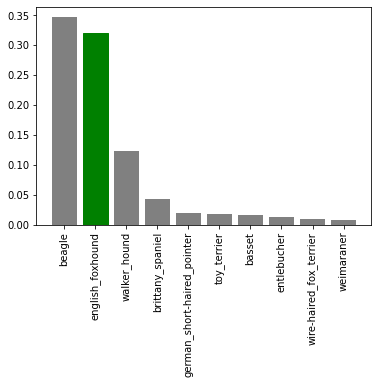

In [ ]:
plot_pred_conf(predictions,val_labels,n=7)

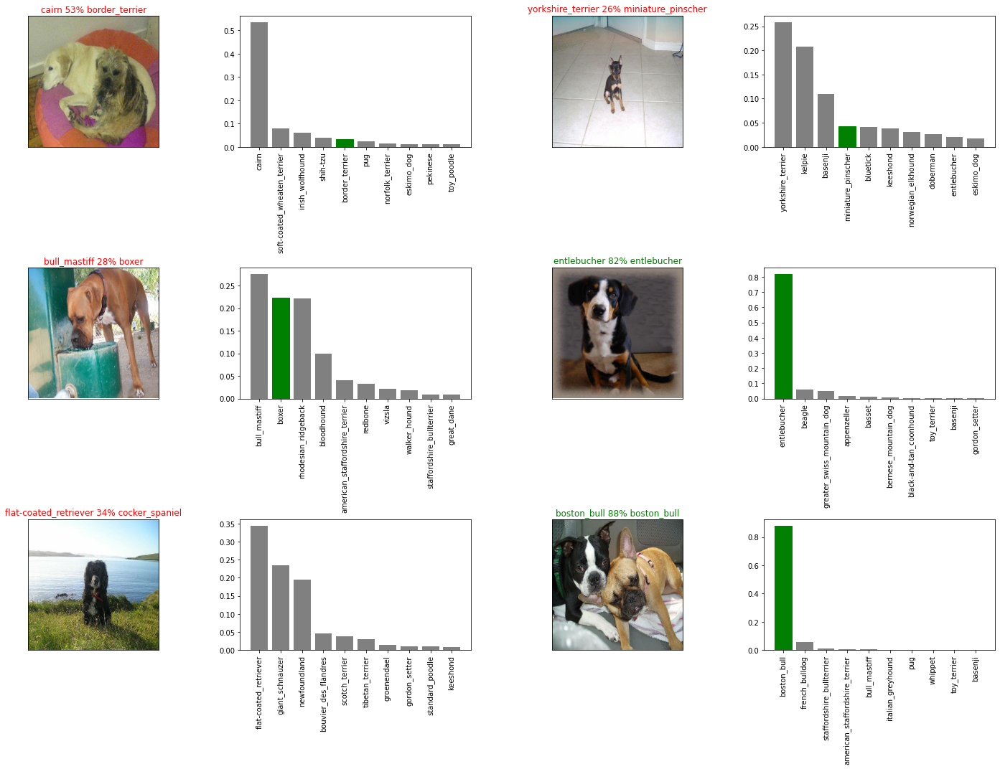

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_prediction_label(predictions,val_images,val_labels,n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Let's save and load a model.

In [ ]:
def save_model(model,suffix=None):
  """
  This function saves the given model into a specific location
  """
  model_dir=os.path.join('drive/MyDrive/Dog_Vision/models',datetime.datetime.now().strftime('%Y%m%d-%H%M%'))
  model_path=model_dir+'-'+suffix+'.h5'

  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path  

In [ ]:
def load_model(model_path):
  """
  This function is used to load a model from a given location
  """
  print(f"Loading model from {model_path}")

  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,'1')

Saving model to: drive/MyDrive/Dog_Vision/models/20220825-1619%-1.h5


'drive/MyDrive/Dog_Vision/models/20220825-1619%-1.h5'

In [ ]:
model.evaluate(valid_batch)

7/7 [==============================] - 1s 123ms/step - loss: 1.2021 - accuracy: 0.6550


[1.2021493911743164, 0.6549999713897705]

In [ ]:
loaded_model=load_model('/content/drive/MyDrive/Dog_Vision/models/20220815-1329%-1.h5')
loaded_model.evaluate(valid_batch)

Loading model from /content/drive/MyDrive/Dog_Vision/models/20220815-1329%-1.h5
7/7 [==============================] - 2s 90ms/step - loss: 1.3254 - accuracy: 0.6550


[1.3254444599151611, 0.6549999713897705]

### Now, let's create a new model and train it on full data

In [ ]:
## Creating data batch of full size 
full_data=create_data_batch(X,y)

full_model=create_model()

full_model_tensorboard=create_tensor_callbacks()

full_model_earlystopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

Creating data batches for train data
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model.fit(x=full_data,epochs=100,callbacks=[full_model_tensorboard,full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 48s 137ms/step - loss: 1.3416 - accuracy: 0.6714
Epoch 2/100
320/320 [==============================] - 40s 125ms/step - loss: 0.3997 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 0.2349 - accuracy: 0.9381
Epoch 4/100
320/320 [==============================] - 50s 157ms/step - loss: 0.1529 - accuracy: 0.9663
Epoch 5/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1061 - accuracy: 0.9774
Epoch 6/100
320/320 [==============================] - 49s 154ms/step - loss: 0.0769 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0580 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0465 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0364 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 38s 119m

### Making predictions on the test data 

As our model has trained on the full data set, now let's make predictions on the test data by following the steps:

* Get the image filenames 
* Turn them into tensors data batches by using `create_data_batches()`
* Use the `predict()` function 

In [ ]:
test_path='drive/MyDrive/Dog_Vision/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
print(test_filenames[:2])

['drive/MyDrive/Dog_Vision/test/e6295bd4afe5ddf93a02cbd668819e9e.jpg', 'drive/MyDrive/Dog_Vision/test/e34bd9a8afc5280b5f2f7489f48c8e7d.jpg']


In [ ]:
test_data=create_data_batch(test_filenames,test_data=True)

Creating data batches for test data


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=full_model.predict(test_data,verbose=1)
np.savetxt('drive/MyDrive/Dog_Vision/predsArray.csv',test_predictions)

324/324 [==============================] - 183s 552ms/step


In [ ]:
test_file=np.loadtxt('drive/MyDrive/Dog_Vision/predsArray.csv')

In [ ]:
test_file 

array([[1.31213884e-09, 3.05556624e-09, 7.62410066e-11, ...,
        2.76630773e-04, 5.05683140e-08, 4.35784325e-10],
       [2.03404329e-12, 1.62152318e-08, 1.07845610e-09, ...,
        6.78645264e-08, 9.67405214e-08, 1.05198172e-09],
       [9.99923110e-01, 1.16544214e-11, 3.78133913e-10, ...,
        4.65689654e-10, 1.78202502e-08, 2.04998738e-08],
       ...,
       [9.95912194e-01, 8.65577761e-07, 1.06670683e-07, ...,
        3.82357932e-08, 2.20436004e-06, 4.13443740e-06],
       [2.42284557e-04, 3.47008253e-08, 2.16348758e-06, ...,
        9.47096680e-07, 7.82636818e-08, 6.44959073e-05],
       [4.48373175e-04, 4.79481010e-10, 3.25477629e-07, ...,
        2.79949663e-08, 1.59189796e-07, 2.03923008e-07]])

In [ ]:
len(test_file)

10357

### Submitting our model to Kaggle 

Finally, we've come to stage of submitting our model 

We've to submit a .csv file with id and accuracy percentages of each unique breed for their respective id 

In [ ]:
DataFrame1=pd.DataFrame(columns=['id']+list(unique_breeds))
DataFrame1.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
DataFrame1['id']=[os.path.splitext(name )[0] for name in os.listdir(test_path)]
DataFrame1[list(unique_breeds)]=test_predictions

In [ ]:
DataFrame1.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6295bd4afe5ddf93a02cbd668819e9e,1.312139e-09,3.055566e-09,7.624101e-11,8.965310e-11,9.945545e-10,6.146527e-07,8.114343e-11,2.235141e-04,5.584533e-07,...,9.621508e-08,4.493675e-07,2.604508e-05,1.114002e-08,1.766734e-09,2.687988e-09,2.498923e-13,2.766308e-04,5.056831e-08,4.357843e-10
1,e34bd9a8afc5280b5f2f7489f48c8e7d,2.034043e-12,1.621523e-08,1.078456e-09,6.249570e-10,9.505391e-09,1.050583e-06,6.385142e-11,1.259628e-11,1.162026e-09,...,5.573718e-10,3.339512e-10,1.844132e-05,2.317493e-05,4.540080e-05,3.042148e-12,2.735194e-12,6.786453e-08,9.674052e-08,1.051982e-09
2,dd7bf84df93991b7c15ec739c82acc04,9.999231e-01,1.165442e-11,3.781339e-10,1.922405e-12,6.294853e-12,2.272633e-12,6.173113e-11,2.411943e-13,3.090683e-12,...,2.688039e-09,4.352068e-11,5.487746e-12,5.414070e-10,4.327251e-12,1.409283e-12,3.621931e-12,4.656897e-10,1.782025e-08,2.049987e-08
3,de85fdcf74dbe025b9b89819735cb9bc,8.472584e-09,3.945457e-09,4.037394e-02,3.192804e-07,3.547569e-05,4.044295e-08,1.552402e-05,1.035129e-07,2.488557e-06,...,3.839352e-04,1.236526e-03,1.779021e-06,4.344804e-10,5.335083e-07,2.109690e-08,1.660140e-08,4.682382e-06,8.181006e-08,1.029704e-05
4,e6ec1891d8f52a13683c73cabd3045cb,7.707050e-07,1.737891e-10,6.390533e-09,1.320471e-04,1.006970e-09,6.212371e-10,3.957009e-11,1.115245e-10,1.638576e-12,...,5.976935e-09,5.346577e-11,1.668598e-11,7.855430e-11,4.968849e-10,7.498286e-09,7.470356e-11,3.011613e-08,4.674098e-05,9.897850e-09


In [ ]:
DataFrame1.to_csv("drive/MyDrive/Dog_Vision/full_model_test_submission_mobileNet.csv",index=False)

In [ ]:
submission_csv=pd.read_csv('drive/MyDrive/Dog_Vision/full_model_test_submission_mobileNet.csv')

In [ ]:
submission_csv.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6295bd4afe5ddf93a02cbd668819e9e,1.312139e-09,3.055566e-09,7.624101e-11,8.965310e-11,9.945545e-10,6.146527e-07,8.114342e-11,2.235141e-04,5.584533e-07,...,9.621508e-08,4.493676e-07,2.604508e-05,1.114002e-08,1.766734e-09,2.687988e-09,2.498923e-13,2.766308e-04,5.056831e-08,4.357843e-10
1,e34bd9a8afc5280b5f2f7489f48c8e7d,2.034043e-12,1.621523e-08,1.078456e-09,6.249570e-10,9.505391e-09,1.050583e-06,6.385142e-11,1.259628e-11,1.162026e-09,...,5.573718e-10,3.339512e-10,1.844132e-05,2.317493e-05,4.540080e-05,3.042148e-12,2.735194e-12,6.786453e-08,9.674052e-08,1.051982e-09
2,dd7bf84df93991b7c15ec739c82acc04,9.999231e-01,1.165442e-11,3.781339e-10,1.922405e-12,6.294853e-12,2.272633e-12,6.173113e-11,2.411943e-13,3.090683e-12,...,2.688039e-09,4.352068e-11,5.487746e-12,5.414070e-10,4.327251e-12,1.409284e-12,3.621931e-12,4.656896e-10,1.782025e-08,2.049987e-08
3,de85fdcf74dbe025b9b89819735cb9bc,8.472584e-09,3.945457e-09,4.037394e-02,3.192804e-07,3.547569e-05,4.044295e-08,1.552402e-05,1.035129e-07,2.488557e-06,...,3.839352e-04,1.236526e-03,1.779021e-06,4.344804e-10,5.335083e-07,2.109690e-08,1.660140e-08,4.682382e-06,8.181007e-08,1.029704e-05
4,e6ec1891d8f52a13683c73cabd3045cb,7.707050e-07,1.737891e-10,6.390532e-09,1.320471e-04,1.006970e-09,6.212371e-10,3.957009e-11,1.115245e-10,1.638576e-12,...,5.976935e-09,5.346577e-11,1.668598e-11,7.855429e-11,4.968849e-10,7.498286e-09,7.470356e-11,3.011613e-08,4.674098e-05,9.897850e-09


## Making predictions on our own data set(custom data set)

For making predictions on our data set. The following steps must be followed: 

* Create file names for the images in the data set.
* Use `create_data_batch()` to make data batches and pass test data as true 
* Make predictions on the created label 
* Use some utility functions like `get_predicted_label()` and some matplotlib functions to visualize the results.

Ok, then let's do it for the one last time.

In [ ]:
## Getting the filenames 
img_path='drive/MyDrive/Dog_Vision/custom_dogs'
file_names =['drive/MyDrive/Dog_Vision/custom_dogs/'+fname for fname in os.listdir(img_path)]
file_names=file_names[1:]
print(file_names)

['drive/MyDrive/Dog_Vision/custom_dogs/images2.jpg', 'drive/MyDrive/Dog_Vision/custom_dogs/images3.jpg', 'drive/MyDrive/Dog_Vision/custom_dogs/images1.jpg']


In [ ]:
## Creating data batches 
data_batch=create_data_batch(X=file_names,test_data=True)


Creating data batches for test data


In [ ]:
## Getting the predictions and getting the label for it
predictions=model.predict(data_batch)
predictions_labels=[get_predicted_label(predictions[i]) for i in range(0,len(predictions))]
print(predictions_labels)

['german_shepherd', 'siberian_husky', 'golden_retriever']


In [ ]:
## Getting our custom images 
custom_images=[]
for image in data_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

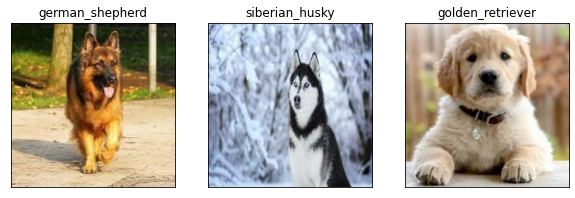

In [ ]:
## Printing the results 
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(predictions_labels[i])
  plt.imshow(image)

### That's it guys thanks for going through this notebook. It means a lot, done a lot of hardwork on this problem statement and it's worth it.